### Project 3B: FEATURE MATCHING for AUTOSTITCHING

For the following sections, we will follow the paper “Multi-Image Matching using Multi-Scale Oriented Patches” by Brown et al. but with several simplifications. Read the paper first and make sure you understand it, then implement the algorithm.

### B.1: Harris Corner Detection
Start with Harris Interest Point Detector (Section 2). We won’t worry about muti-scale – just do a single scale. Also, don’t worry about sub-pixel accuracy. Re-implementing Harris is a thankless task – so you can use my sample code: harris.py . Include on your webpage a figure of the Harris corners overlaid on the image.
Implement Adaptive Non-Maximal Suppression (ANMS, Section 3). Include on your webpage a figure of the chosen corners overlaid on the image. This section has multiple moving parts; you may need to read it a few times. You may want to skip this step and come back to it; just choose a random set of corners instead in the meantime.
 

Deliverables: Show detected corners overlaid on image, with and without ANMS.

In [1]:
import numpy as np
from skimage.feature import corner_harris, peak_local_max


def get_harris_corners(im, edge_discard=20):
    """
    This function takes a b&w image and an optional amount to discard
    on the edge (default is 5 pixels), and finds all harris corners
    in the image. Harris corners near the edge are discarded and the
    coordinates of the remaining corners are returned. A 2d array (h)
    containing the h value of every pixel is also returned.

    h is the same shape as the original image, im.
    coords is 2 x n (ys, xs).
    """

    assert edge_discard >= 20

    # find harris corners
    h = corner_harris(im, method='eps', sigma=1)
    coords = peak_local_max(h, min_distance=1)

    # discard points on edge
    edge = edge_discard  # pixels
    mask = (coords[:, 0] > edge) & \
           (coords[:, 0] < im.shape[0] - edge) & \
           (coords[:, 1] > edge) & \
           (coords[:, 1] < im.shape[1] - edge)
    coords = coords[mask].T
    return h, coords


def dist2(x, c):
    """
    dist2  Calculates squared distance between two sets of points.

    Description
    D = DIST2(X, C) takes two matrices of vectors and calculates the
    squared Euclidean distance between them.  Both matrices must be of
    the same column dimension.  If X has M rows and N columns, and C has
    L rows and N columns, then the result has M rows and L columns.  The
    I, Jth entry is the  squared distance from the Ith row of X to the
    Jth row of C.

    Adapted from code by Christopher M Bishop and Ian T Nabney.
    """

    ndata, dimx = x.shape
    ncenters, dimc = c.shape
    assert dimx == dimc, 'Data dimension does not match dimension of centers'

    return (np.ones((ncenters, 1)) * np.sum((x**2).T, axis=0)).T + \
            np.ones((   ndata, 1)) * np.sum((c**2).T, axis=0)    - \
            2 * np.inner(x, c)



In [2]:
def harmonic_mean_harris(im, sigma_d=1.0, sigma_i=1.5, threshold=10.0):
    im_smooth = filters.gaussian(im, sigma=sigma_d)
    Ix = ndimage.sobel(im_smooth, axis=1)  # x gradient
    Iy = ndimage.sobel(im_smooth, axis=0)  # y gradient
    Ixx = Ix * Ix
    Ixy = Ix * Iy
    Iyy = Iy * Iy
    
    Ixx_smooth = filters.gaussian(Ixx, sigma=sigma_i)
    Ixy_smooth = filters.gaussian(Ixy, sigma=sigma_i) 
    Iyy_smooth = filters.gaussian(Iyy, sigma=sigma_i)
    
    det_H = Ixx_smooth * Iyy_smooth - Ixy_smooth**2
    trace_H = Ixx_smooth + Iyy_smooth
    
    corner_strength = np.zeros_like(det_H)
    nonzero_mask = trace_H > 1e-6
    corner_strength[nonzero_mask] = det_H[nonzero_mask] / trace_H[nonzero_mask]
    
    local_maxima = peak_local_max(corner_strength, min_distance=1, threshold_abs=threshold, exclude_border=True)
    
    edge_discard = 20
    mask = (local_maxima[:, 0] > edge_discard) & \
           (local_maxima[:, 0] < im.shape[0] - edge_discard) & \
           (local_maxima[:, 1] > edge_discard) & \
           (local_maxima[:, 1] < im.shape[1] - edge_discard)
    
    coords = local_maxima[mask].T
    
    return corner_strength, coords

In [3]:
def anms(coords, corner_strength, num_points=500, c_robust=0.9):
    """
    Adaptive Non-Maximal Suppression for selecting well-distributed interest points.
    """
    coords_t = coords.T
    n = coords_t.shape[0]
    if n == 0:
        return coords, np.array([])
    suppression_radii = np.zeros(n)
    tree = KDTree(coords_t)
    strengths = corner_strength[coords[0], coords[1]]
    for i in range(n):
        current_strength = strengths[i]
        # Find points with significantly higher strength: f(x_j) > f(x_i) / c_robust
        stronger_mask = strengths > (current_strength / c_robust)
        if not np.any(stronger_mask):
            suppression_radii[i] = np.inf
        else:
            # Find distance to nearest stronger point
            stronger_indices = np.where(stronger_mask)[0]
            stronger_coords = coords_t[stronger_indices]
            if stronger_coords.shape[0] > 0:
                distances = tree.query(coords_t[i], k=len(stronger_indices))[0]
                suppression_radii[i] = np.min(distances)
            else:
                suppression_radii[i] = np.inf
    if n <= num_points:
        return coords, suppression_radii
    else:
        sorted_indices = np.argsort(-suppression_radii)
        selected_indices = sorted_indices[:num_points]
        selected_coords = coords_t[selected_indices].T
        selected_radii = suppression_radii[selected_indices]
        
        return selected_coords, selected_radii

In [4]:
def visualize_results(im, all_coords, anms_coords, corner_strength):
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes[0, 0].imshow(im, cmap='gray')
    axes[0, 0].plot(all_coords[1], all_coords[0], 'r.', markersize=2, alpha=0.7)
    axes[0, 0].set_title(f'All Harris Corners ({all_coords.shape[1]} points)')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(im, cmap='gray')
    axes[0, 1].plot(anms_coords[1], anms_coords[0], 'r.', markersize=3)
    axes[0, 1].set_title(f'ANMS Selected ({anms_coords.shape[1]} points)')
    axes[0, 1].axis('off')
    
    im_corner = axes[1, 0].imshow(corner_strength, cmap='hot')
    axes[1, 0].set_title('Corner Strength Map (Harmonic Mean)')
    axes[1, 0].axis('off')
    plt.colorbar(im_corner, ax=axes[1, 0])
    
    axes[1, 1].hist(corner_strength[all_coords[0], all_coords[1]], bins=50, alpha=0.7, label='All corners')
    if anms_coords.shape[1] > 0:
        axes[1, 1].hist(corner_strength[anms_coords[0], anms_coords[1]], bins=50, alpha=0.7, label='ANMS corners')
    axes[1, 1].set_title('Corner Strength Distribution')
    axes[1, 1].set_xlabel('Corner Strength')
    axes[1, 1].set_ylabel('Count')
    axes[1, 1].legend()
    
    plt.tight_layout()
    plt.savefig('harris_anms_results.png', bbox_inches='tight', dpi=300)
    plt.show()

In [5]:
def main():
    try:
        im = io.imread('IMG_1765-compressed-1.jpg')
        if len(im.shape) == 3:
            im_gray = color.rgb2gray(im)
        else:
            im_gray = im
    except:
        print("Creating sample image for demonstration")
        im_gray = np.random.rand(400, 400)
        im_gray = (im_gray * 255).astype(np.uint8)
        im = im_gray
    
    print("=== Harris Corner Detection (Harmonic Mean) ===")
    
    corner_strength, all_coords = harmonic_mean_harris(im_gray, threshold=0.05)
    print(f"Found {all_coords.shape[1]} Harris corners")
    
    num_desired = 500
    anms_coords, radii = anms(all_coords, corner_strength, num_desired)
    print(f"ANMS selected {anms_coords.shape[1]} points")
    visualize_results(im_gray, all_coords, anms_coords, corner_strength)
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(im_gray, cmap='gray')
    plt.plot(all_coords[1], all_coords[0], 'r.', markersize=2)
    plt.title(f'Harris Corners ({all_coords.shape[1]} points)')
    plt.axis('off')
    plt.savefig('harris_corners.png', bbox_inches='tight', dpi=300)
    
    plt.subplot(1, 2, 2)
    plt.imshow(im_gray, cmap='gray')
    plt.plot(anms_coords[1], anms_coords[0], 'r.', markersize=3)
    plt.title(f'ANMS Selected ({anms_coords.shape[1]} points)')
    plt.axis('off')
    plt.savefig('anms_corners.png', bbox_inches='tight', dpi=300)
    
    plt.show()
    
    return all_coords, anms_coords, corner_strength

In [6]:
# def tune_harris_parameters(im_gray):
#     thresholds = [0.05, 0.2, 0.3, 0.4]
#     sigma_d_values = [0.7, 1.0, 1.3]
#     sigma_i_values = [1.0, 1.5, 2.0]
    
#     fig, axes = plt.subplots(len(thresholds), 3, figsize=(15, 5*len(thresholds)))
    
#     for i, threshold in enumerate(thresholds):
#         for j, (sigma_d, sigma_i) in enumerate(zip(sigma_d_values, sigma_i_values)):
#             corner_strength, coords = harmonic_mean_harris(
#                 im_gray, sigma_d=sigma_d, sigma_i=sigma_i, threshold=threshold
#             )
#             axes[i, j].imshow(im_gray, cmap='gray')
#             axes[i, j].plot(coords[1], coords[0], 'r.', markersize=2)
#             axes[i, j].set_title(f'thresh={threshold}, σ_d={sigma_d}, σ_i={sigma_i}\n({coords.shape[1]} corners)')
#             axes[i, j].axis('off')
#     plt.tight_layout()
#     plt.savefig('parameter_tuning.png', bbox_inches='tight', dpi=300)
#     plt.show()

=== Harris Corner Detection (Harmonic Mean) ===
Found 1385 Harris corners
ANMS selected 500 points


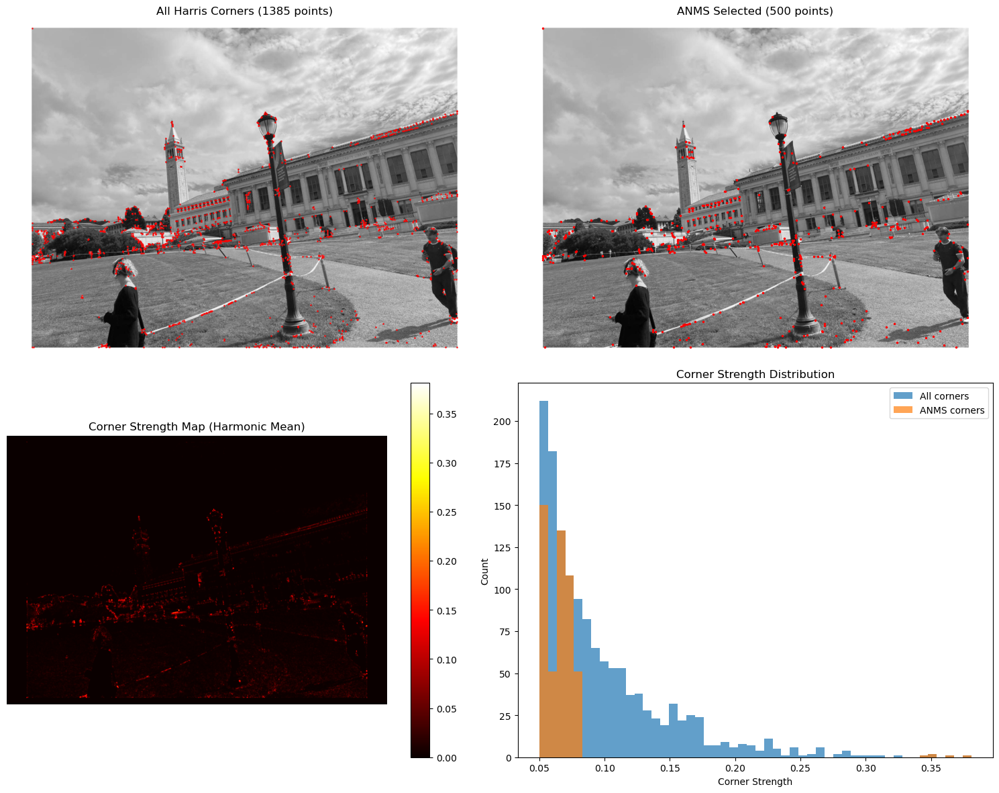

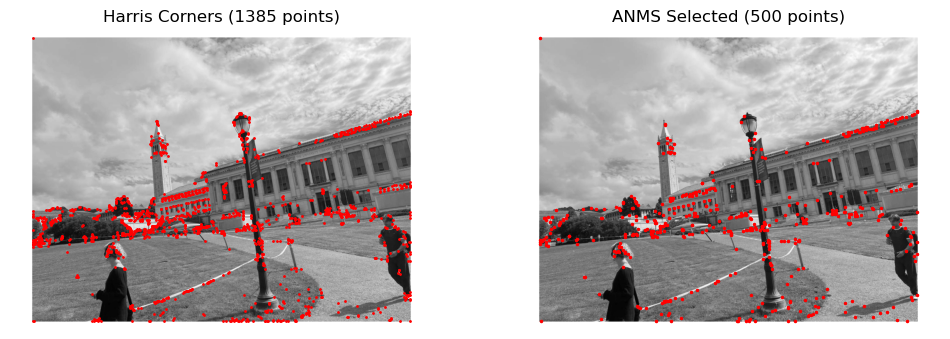

In [7]:
from scipy.spatial import KDTree
import matplotlib.pyplot as plt
from skimage import filters
from scipy import ndimage
from skimage import color
from skimage import io
 
if __name__ == "__main__":
    all_corners, anms_corners, corner_response = main()
    im_gray = color.rgb2gray(io.imread('IMG_1765-compressed-1.jpg'))
    # tune_harris_parameters(im_gray)

### B.2: Feature Descriptor Extraction
Implement Feature Descriptor extraction (Section 4 of the paper). Don’t worry about rotation-invariance – just extract axis-aligned 8x8 patches. Note that it’s extremely important to sample these patches from the larger 40x40 window to have a nice big blurred descriptor. Don’t forget to bias/gain-normalize the descriptors. Ignore the wavelet transform section.

 

Deliverables: Extract normalized 8x8 feature descriptors. Show several extracted features.

In [8]:
def extract_feature_descriptors(im, coords, patch_size=8, sample_spacing=5, window_size=40):
    if coords.shape[1] == 0:
        return np.array([])
    descriptors = []
    half_window = window_size // 2
    half_patch = patch_size // 2
    
    for i in range(coords.shape[1]):
        y, x = coords[0, i], coords[1, i]
        
        y_start = int(y - half_window)
        y_end = int(y + half_window)
        x_start = int(x - half_window)
        x_end = int(x + half_window)
        
        if (y_start < 0 or y_end >= im.shape[0] or 
            x_start < 0 or x_end >= im.shape[1]):
            continue 
        window = im[y_start:y_end, x_start:x_end]
        
        # Sample 8x8 patch from the 40x40 window with spacing of 5 pixels
        descriptor = np.zeros((patch_size, patch_size))
        for i_patch in range(patch_size):
            for j_patch in range(patch_size):
                # Map patch coordinates to window coordinates with sample spacing
                y_win = i_patch * sample_spacing + (sample_spacing // 2)
                x_win = j_patch * sample_spacing + (sample_spacing // 2)
                descriptor[i_patch, j_patch] = window[y_win, x_win]
        
        # Bias/gain normalization: mean=0, std=1
        descriptor_normalized = (descriptor - np.mean(descriptor)) / (np.std(descriptor) + 1e-8)
        descriptors.append(descriptor_normalized.flatten())
    return np.array(descriptors)

In [9]:
def visualize_descriptors(im, coords, descriptors, num_to_show=5):
    if descriptors.shape[0] == 0:
        print("No descriptors to visualize")
        return
    num_to_show = min(num_to_show, descriptors.shape[0])
    fig, axes = plt.subplots(2, num_to_show, figsize=(3*num_to_show, 6))
    for i in range(num_to_show):
        axes[0, i].imshow(im, cmap='gray')
        axes[0, i].plot(coords[1, i], coords[0, i], 'ro', markersize=8)
        axes[0, i].set_title(f'Feature {i+1}')
        axes[0, i].axis('off')
        
        descriptor_2d = descriptors[i].reshape(8, 8)
        axes[1, i].imshow(descriptor_2d, cmap='viridis')
        axes[1, i].set_title(f'Descriptor {i+1}')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.savefig('feature_descriptors.png', bbox_inches='tight', dpi=300)
    plt.show()

In [10]:
def main(im):
    # im = io.imread('IMG_1765-compressed-1.jpg')
    if len(im.shape) == 3:
        im_gray = color.rgb2gray(im)
    else:
        im_gray = im
    print("=== Harris Corner Detection (Harmonic Mean) ===")
    corner_strength, all_coords = harmonic_mean_harris(im_gray, threshold=0.05)
    print(f"Found {all_coords.shape[1]} Harris corners")
    
    num_desired = 500
    anms_coords, radii = anms(all_coords, corner_strength, num_desired)
    
    print(f"ANMS selected {anms_coords.shape[1]} points")
    visualize_results(im_gray, all_coords, anms_coords, corner_strength)
    
    # Individual plots for web page
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(im_gray, cmap='gray')
    plt.plot(all_coords[1], all_coords[0], 'r.', markersize=2)
    plt.title(f'Harris Corners ({all_coords.shape[1]} points)')
    plt.axis('off')
    plt.savefig('harris_corners.png', bbox_inches='tight', dpi=300)
    
    plt.subplot(1, 2, 2)
    plt.imshow(im_gray, cmap='gray')
    plt.plot(anms_coords[1], anms_coords[0], 'r.', markersize=3)
    plt.title(f'ANMS Selected ({anms_coords.shape[1]} points)')
    plt.axis('off')
    plt.savefig('anms_corners.png', bbox_inches='tight', dpi=300)
    
    plt.show()

    print("=== Feature Descriptor Extraction ===")
    descriptors = extract_feature_descriptors(im_gray, anms_coords)
    print(f"Extracted {descriptors.shape[0]} feature descriptors")
    visualize_descriptors(im_gray, anms_coords, descriptors, num_to_show=5)
    
    return all_coords, anms_coords, corner_strength, descriptors

=== Harris Corner Detection (Harmonic Mean) ===
Found 1385 Harris corners
ANMS selected 500 points


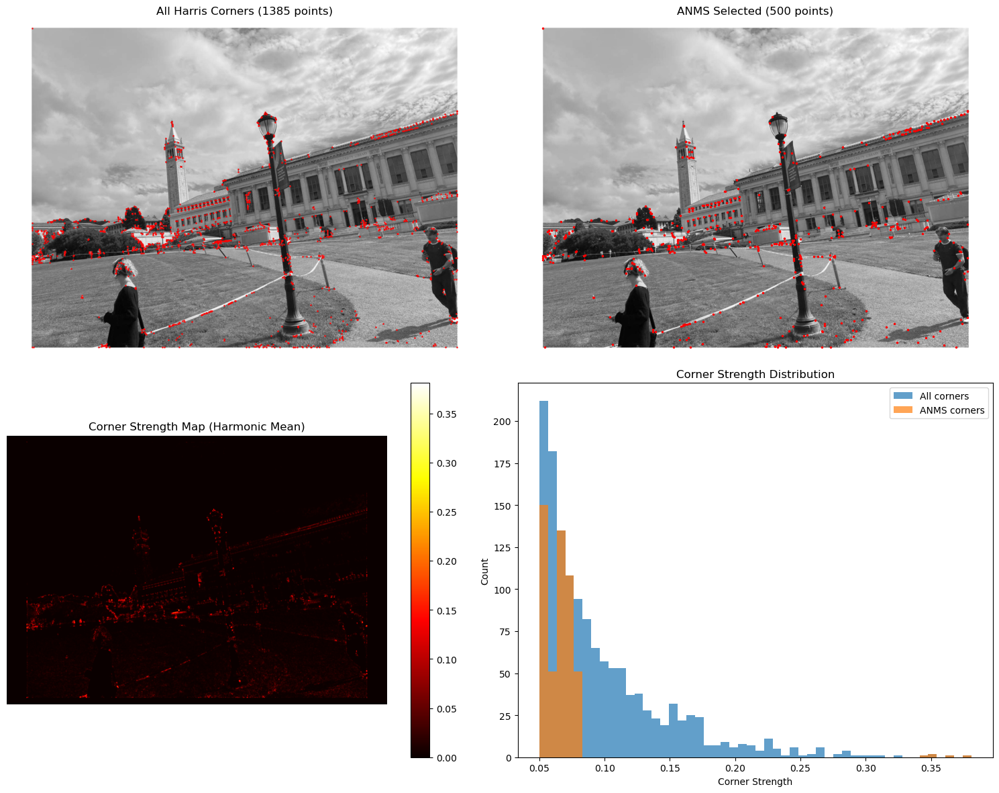

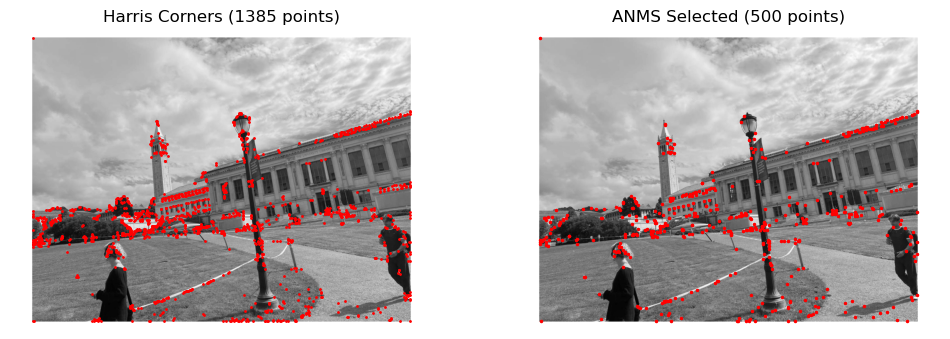

=== Feature Descriptor Extraction ===
Extracted 500 feature descriptors


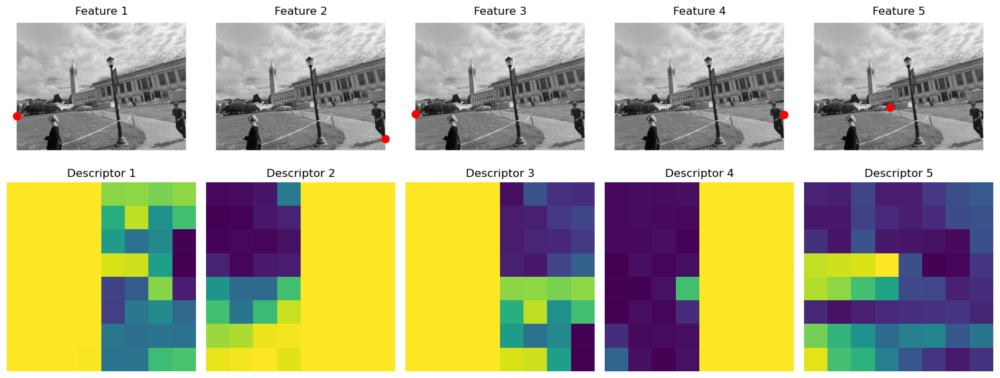

In [11]:
if __name__ == "__main__":
    all_corners, anms_corners, corner_response, descriptors = main(im = io.imread('IMG_1765-compressed-1.jpg'))
    
    # Uncomment to tune parameters
    # im_gray = color.rgb2gray(io.imread('fnaf.jpg'))
    # tune_harris_parameters(im_gray)

### B.3: Feature Matching
Implement Feature Matching (Section 5 of the paper). That is, you will need to find pairs of features that look similar and are thus likely to be good matches. For thresholding, use the simpler approach due to Lowe of thresholding on the ratio between the first and the second nearest neighbors. Consult Figure 6b in the paper for picking the threshold. Ignore Section 6 of the paper.

 

Deliverables: Show matched features between image pairs.

In [12]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

def match_features(descriptors1, descriptors2, ratio_threshold=0.8):
    if descriptors1.shape[0] == 0 or descriptors2.shape[0] == 0:
        return np.array([]), np.array([])
    
    # Find 2 nearest neighbors for each descriptor in image 1
    nbrs = NearestNeighbors(n_neighbors=2, algorithm='auto').fit(descriptors2)
    distances, indices = nbrs.kneighbors(descriptors1)
    
    # Apply Lowe's ratio test: distance_1nn / distance_2nn < threshold
    ratios = distances[:, 0] / (distances[:, 1] + 1e-8)
    mask = ratios < ratio_threshold
    
    # Create matches array [index_in_img1, index_in_img2]
    matches = np.column_stack([np.where(mask)[0], indices[mask, 0]])
    match_distances = distances[mask, 0]
    
    return matches, match_distances

In [13]:
def demonstrate_feature_matching(im1, im2, ratio_thresholds=[0.6, 0.7, 0.8, 0.9]):
    if len(im1.shape) == 3:
        im1_gray = color.rgb2gray(im1)
    else:
        im1_gray = im1
    if len(im2.shape) == 3:
        im2_gray = color.rgb2gray(im2)
    else:
        im2_gray = im2
    
    print("=== Feature Detection ===")
    
    corner_strength1, coords1 = harmonic_mean_harris(im1_gray, threshold=0.1)
    coords1_anms, _ = anms(coords1, corner_strength1, num_points=500)
    descriptors1 = extract_feature_descriptors(im1_gray, coords1_anms)
    
    corner_strength2, coords2 = harmonic_mean_harris(im2_gray, threshold=0.1)
    coords2_anms, _ = anms(coords2, corner_strength2, num_points=500)
    descriptors2 = extract_feature_descriptors(im2_gray, coords2_anms)
    
    print(f"Image 1: {descriptors1.shape[0]} descriptors")
    print(f"Image 2: {descriptors2.shape[0]} descriptors")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    for i, ratio_threshold in enumerate(ratio_thresholds):
        matches, distances = match_features(descriptors1, descriptors2, ratio_threshold)
        
        h1, w1 = im1_gray.shape
        h2, w2 = im2_gray.shape
        composite = np.zeros((max(h1, h2), w1 + w2))
        composite[:h1, :w1] = im1_gray
        composite[:h2, w1:w1+w2] = im2_gray
        axes[i].imshow(composite, cmap='gray')
        
        matched_pts1 = np.column_stack([coords1_anms[1, matches[:, 0]], coords1_anms[0, matches[:, 0]]])
        matched_pts2 = np.column_stack([coords2_anms[1, matches[:, 1]], coords2_anms[0, matches[:, 1]]])
        for j in range(len(matches)):
            x1, y1 = matched_pts1[j, 0], matched_pts1[j, 1]
            x2, y2 = matched_pts2[j, 0] + w1, matched_pts2[j, 1]
            axes[i].plot([x1, x2], [y1, y2], 'g-', linewidth=0.8, alpha=0.7)
        axes[i].plot(coords1_anms[1], coords1_anms[0], 'ro', markersize=2, alpha=0.5, label='Image 1 features')
        axes[i].plot(coords2_anms[1] + w1, coords2_anms[0], 'bo', markersize=2, alpha=0.5, label='Image 2 features')
        axes[i].set_title(f'Ratio Threshold: {ratio_threshold}\n{len(matches)} matches')
        axes[i].axis('off')
        axes[i].legend()
    
    plt.tight_layout()
    plt.savefig('feature_matching_comparison.png', bbox_inches='tight', dpi=300)
    plt.show()
    
    return descriptors1, descriptors2, coords1_anms, coords2_anms

def analyze_match_quality(im1, im2, ratio_threshold=0.8):
    if len(im1.shape) == 3:
        im1_gray = color.rgb2gray(im1)
    else:
        im1_gray = im1
    if len(im2.shape) == 3:
        im2_gray = color.rgb2gray(im2)
    else:
        im2_gray = im2
    corner_strength1, coords1 = harmonic_mean_harris(im1_gray, threshold=0.1)
    coords1_anms, _ = anms(coords1, corner_strength1, num_points=500)
    descriptors1 = extract_feature_descriptors(im1_gray, coords1_anms)
    
    corner_strength2, coords2 = harmonic_mean_harris(im2_gray, threshold=0.1)
    coords2_anms, _ = anms(coords2, corner_strength2, num_points=500)
    descriptors2 = extract_feature_descriptors(im2_gray, coords2_anms)
    
    matches, distances = match_features(descriptors1, descriptors2, ratio_threshold)
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    h1, w1 = im1_gray.shape
    h2, w2 = im2_gray.shape
    composite = np.zeros((max(h1, h2), w1 + w2))
    composite[:h1, :w1] = im1_gray
    composite[:h2, w1:w1+w2] = im2_gray
    
    axes[0, 0].imshow(composite, cmap='gray')
    matched_pts1 = np.column_stack([coords1_anms[1, matches[:, 0]], coords1_anms[0, matches[:, 0]]])
    matched_pts2 = np.column_stack([coords2_anms[1, matches[:, 1]], coords2_anms[0, matches[:, 1]]])
    for j in range(len(matches)):
        x1, y1 = matched_pts1[j, 0], matched_pts1[j, 1]
        x2, y2 = matched_pts2[j, 0] + w1, matched_pts2[j, 1]
        axes[0, 0].plot([x1, x2], [y1, y2], 'g-', linewidth=0.8, alpha=0.7)
    
    axes[0, 0].set_title(f'Feature Matches (Ratio Threshold: {ratio_threshold})\n{len(matches)} matches')
    axes[0, 0].axis('off')
    axes[0, 1].hist(distances, bins=30, alpha=0.7, color='skyblue')
    axes[0, 1].axvline(np.mean(distances), color='red', linestyle='--', label=f'Mean: {np.mean(distances):.2f}')
    axes[0, 1].set_xlabel('Feature Distance')
    axes[0, 1].set_ylabel('Count')
    axes[0, 1].set_title('Match Distance Distribution')
    axes[0, 1].legend()
    axes[1, 0].imshow(im1_gray, cmap='gray')
    axes[1, 0].plot(coords1_anms[1], coords1_anms[0], 'r.', markersize=2)
    axes[1, 0].set_title(f'Image 1 Features: {coords1_anms.shape[1]} points')
    axes[1, 0].axis('off')
    axes[1, 1].imshow(im2_gray, cmap='gray')
    axes[1, 1].plot(coords2_anms[1], coords2_anms[0], 'r.', markersize=2)
    axes[1, 1].set_title(f'Image 2 Features: {coords2_anms.shape[1]} points')
    axes[1, 1].axis('off')
    plt.tight_layout()
    plt.savefig('feature_matching_analysis.png', bbox_inches='tight', dpi=300)
    plt.show()
    
    print(f"=== Match Quality Analysis ===")
    print(f"Total matches: {len(matches)}")
    print(f"Average match distance: {np.mean(distances):.2f}")
    print(f"Match distance std: {np.std(distances):.2f}")
    print(f"Match rate: {len(matches) / min(len(descriptors1), len(descriptors2)) * 100:.1f}%")
    
    return matches, distances, coords1_anms, coords2_anms

In [14]:
import os
def run_feature_matching_pipeline(im1_path, im2_path, label, ratio_threshold=0.8):
    print(f"\n=== Running Feature Matching for {label} ===")
    im1 = io.imread(im1_path)
    im2 = io.imread(im2_path)
    descriptors1, descriptors2, coords1, coords2 = demonstrate_feature_matching(im1, im2)
    matches, distances, coords1_anms, coords2_anms = analyze_match_quality(im1, im2, ratio_threshold=ratio_threshold)
    # Define destination filenames
    comparison_dst = f'feature_matching_comparison_{label}.png'
    analysis_dst = f'feature_matching_analysis_{label}.png'
    
    # Remove existing files if they exist
    for dst in [comparison_dst, analysis_dst]:
        if os.path.exists(dst):
            os.remove(dst)
    
    # Rename output files
    os.rename('feature_matching_comparison.png', comparison_dst)
    os.rename('feature_matching_analysis.png', analysis_dst)
    
    print(f"Completed {label}")
    print(f"Saved: {comparison_dst} and {analysis_dst}")



=== Running Feature Matching for pair1 ===
=== Feature Detection ===
Image 1: 164 descriptors
Image 2: 111 descriptors


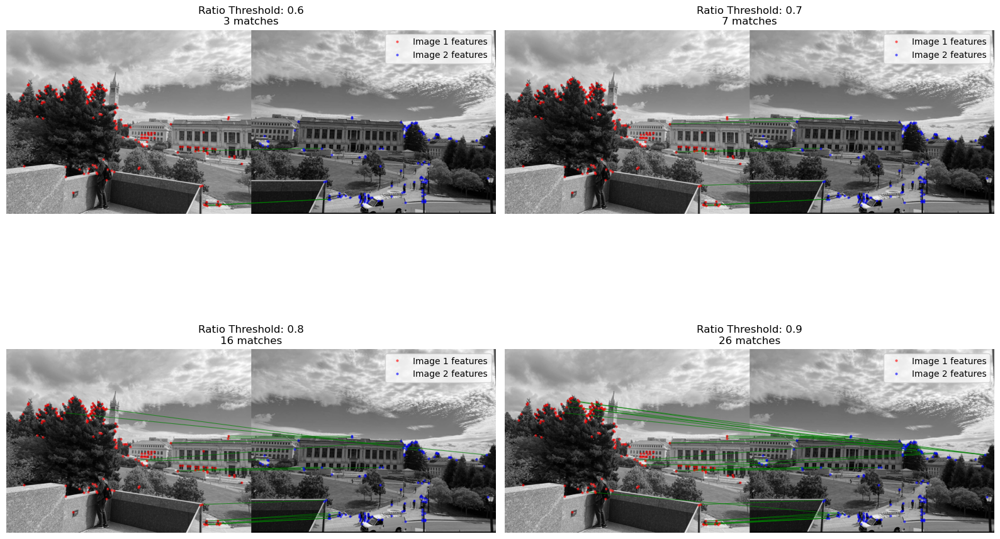

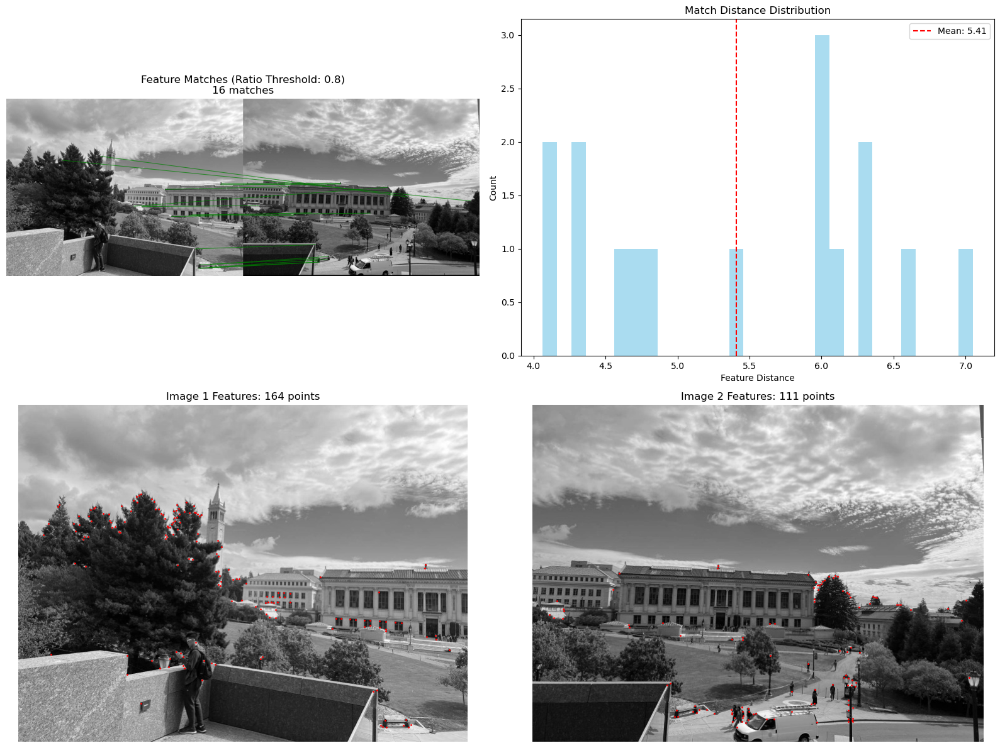

=== Match Quality Analysis ===
Total matches: 16
Average match distance: 5.41
Match distance std: 0.96
Match rate: 14.4%
Completed pair1
Saved: feature_matching_comparison_pair1.png and feature_matching_analysis_pair1.png

=== Running Feature Matching for pair2 ===
=== Feature Detection ===
Image 1: 69 descriptors
Image 2: 79 descriptors


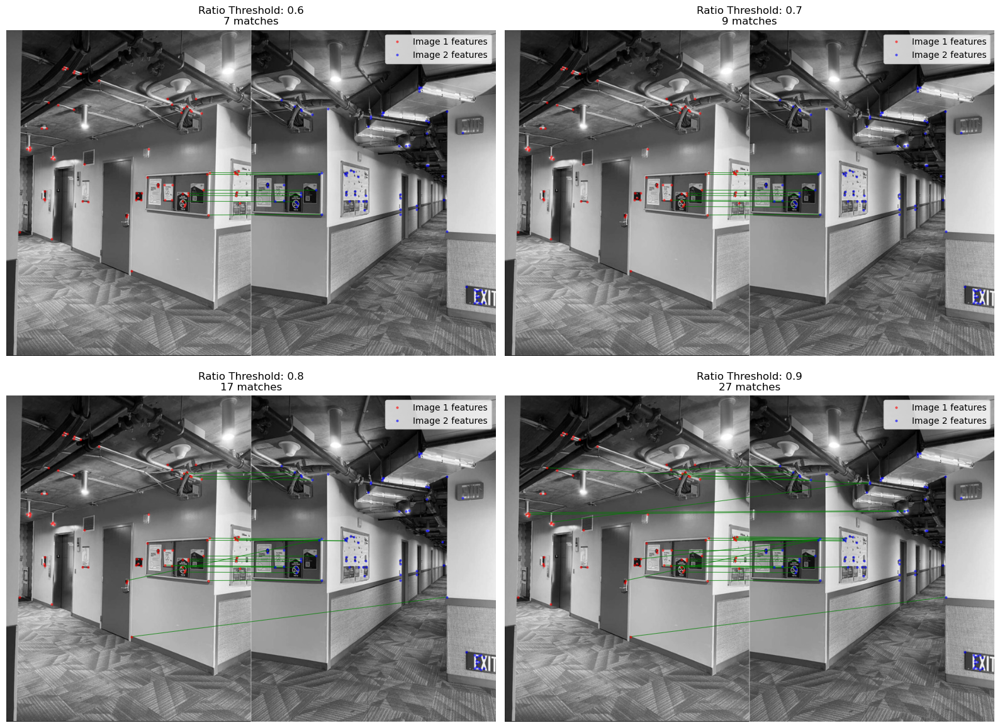

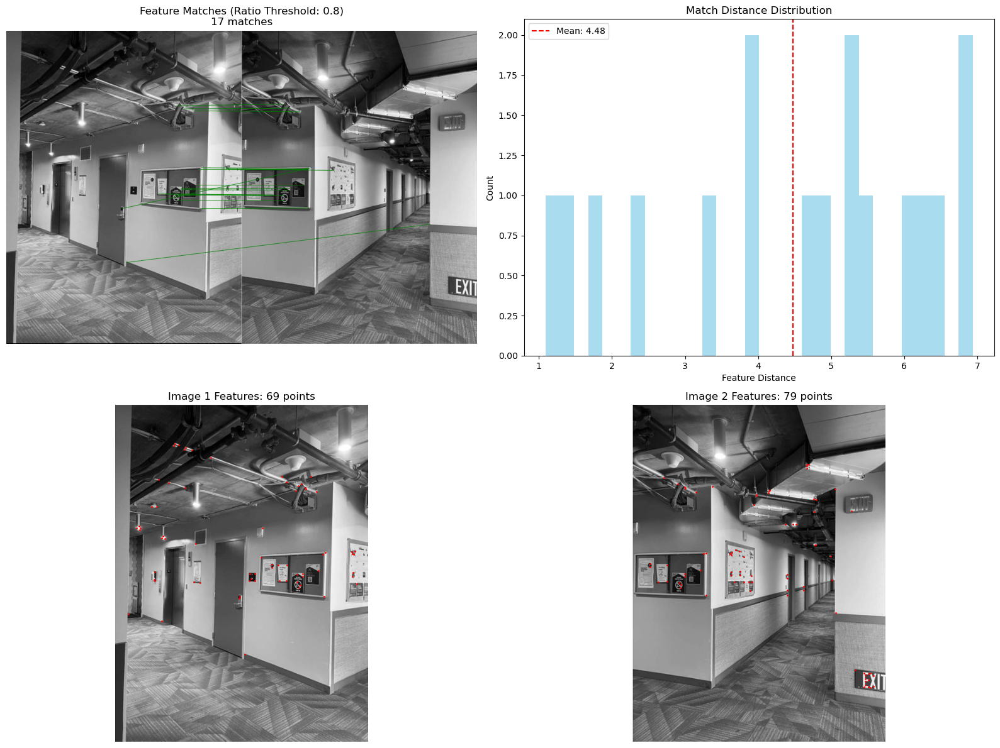

=== Match Quality Analysis ===
Total matches: 17
Average match distance: 4.48
Match distance std: 1.87
Match rate: 24.6%
Completed pair2
Saved: feature_matching_comparison_pair2.png and feature_matching_analysis_pair2.png

=== Running Feature Matching for pair3 ===
=== Feature Detection ===
Image 1: 177 descriptors
Image 2: 110 descriptors


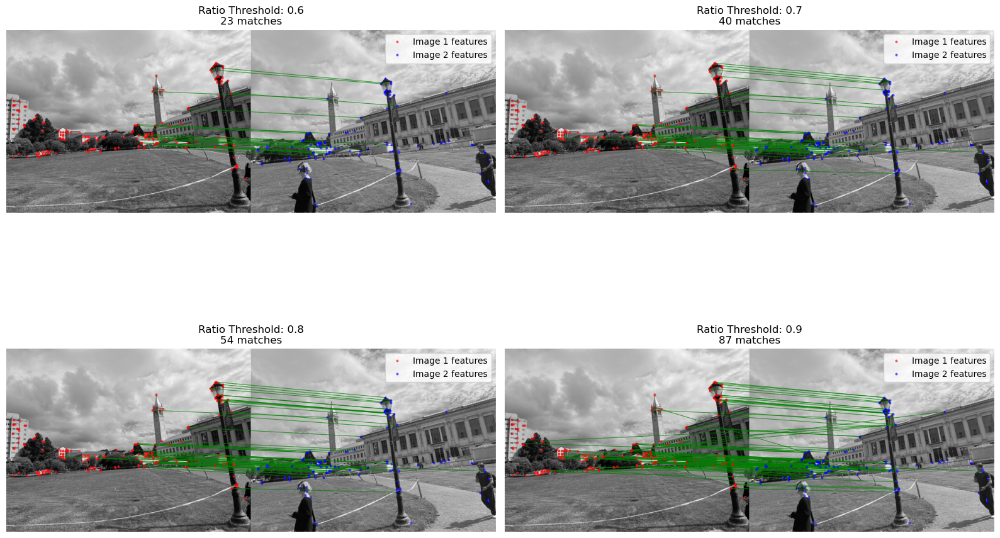

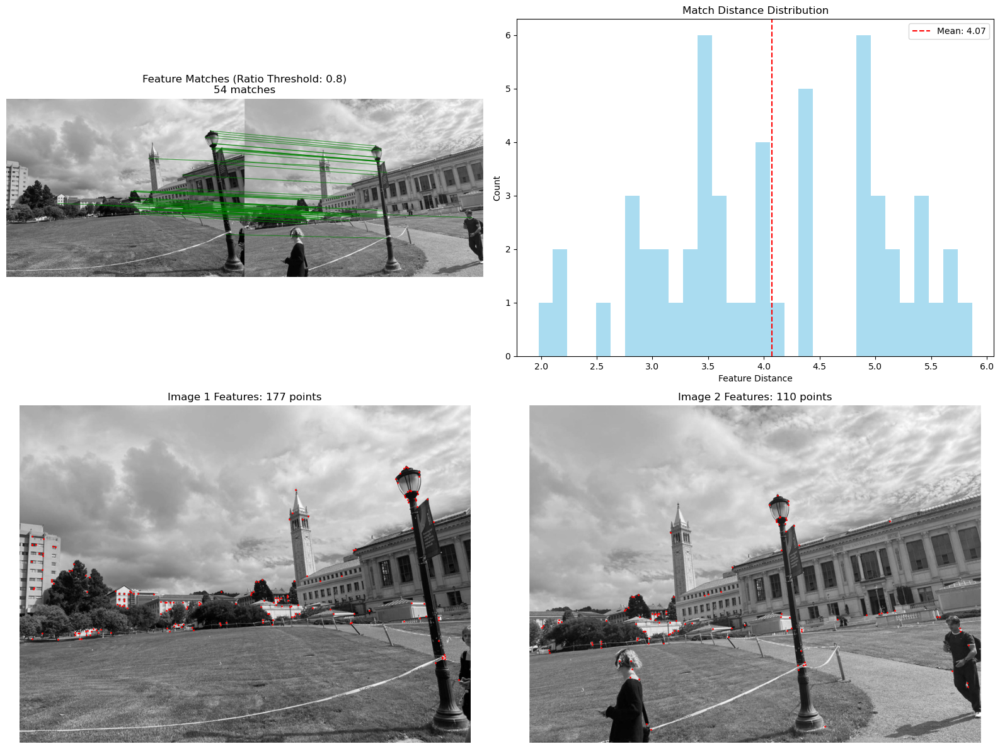

=== Match Quality Analysis ===
Total matches: 54
Average match distance: 4.07
Match distance std: 1.01
Match rate: 49.1%
Completed pair3
Saved: feature_matching_comparison_pair3.png and feature_matching_analysis_pair3.png

=== Running Feature Matching for pair4 ===
=== Feature Detection ===
Image 1: 14 descriptors
Image 2: 17 descriptors


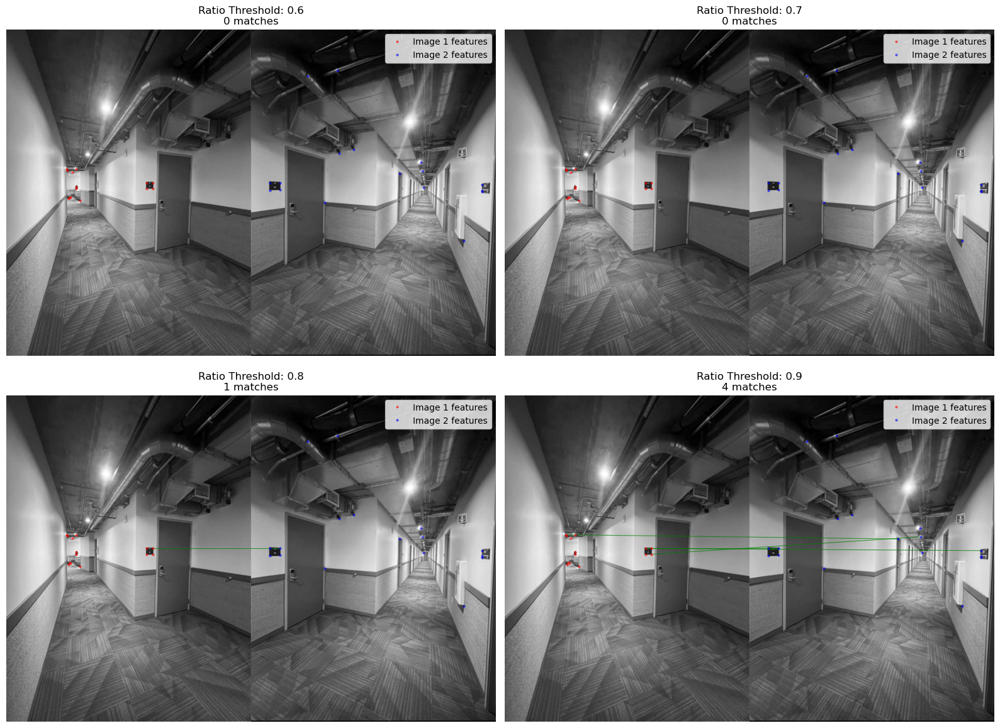

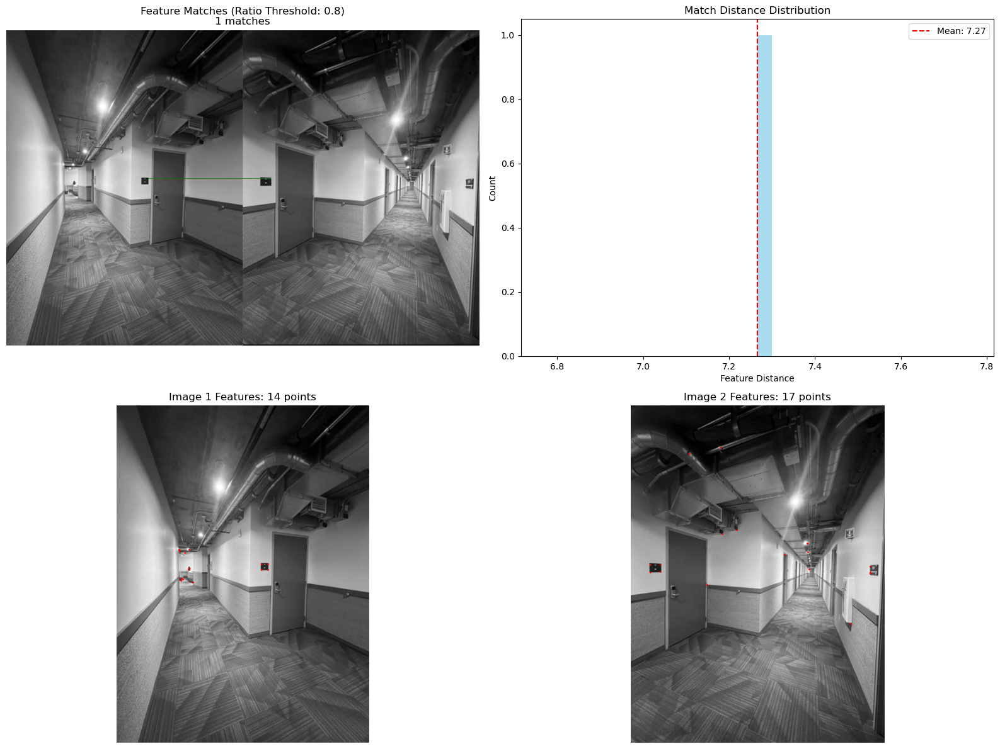

=== Match Quality Analysis ===
Total matches: 1
Average match distance: 7.27
Match distance std: 0.00
Match rate: 7.1%
Completed pair4
Saved: feature_matching_comparison_pair4.png and feature_matching_analysis_pair4.png


In [15]:
run_feature_matching_pipeline('DoeLibrary1.jpg', 'DoeLibrary2.jpg', label='pair1')
run_feature_matching_pipeline('test1.jpg', 'test2.jpg', label='pair2')
run_feature_matching_pipeline('test3.jpg', 'test4.jpg', label='pair3')
run_feature_matching_pipeline('test5.jpg', 'test6.jpg', label='pair4')

### B.4: RANSAC for Robust Homography
For step 4, use 4-point RANSAC as described in class to compute robust homography estimates. Then, produce mosaics by adapting your code from Part A. You may use the same images from part A, but show both manually and automatically stitched results side by side. Produce at least three mosaics.

 

Deliverables: Implement 4-point RANSAC from scratch. Show comparison of stitching manually and automatically. Create >=3 automatic mosaics.

In [16]:
def visualize_ransac_results(im1, im2, coords1, coords2, matches, inliers, H):
    h1, w1 = im1.shape
    h2, w2 = im2.shape
    composite = np.zeros((max(h1, h2), w1 + w2))
    composite[:h1, :w1] = im1
    composite[:h2, w1:w1+w2] = im2
    
    plt.figure(figsize=(15, 8))
    plt.imshow(composite, cmap='gray')
    
    # Convert coordinates to (x, y) format
    matched_pts1 = np.column_stack([coords1[1, matches[:, 0]], coords1[0, matches[:, 0]]])
    matched_pts2 = np.column_stack([coords2[1, matches[:, 1]], coords2[0, matches[:, 1]]])
    
    # Plot inliers (green) and outliers (red)
    for i, match in enumerate(matches):
        x1, y1 = matched_pts1[i, 0], matched_pts1[i, 1]
        x2, y2 = matched_pts2[i, 0] + w1, matched_pts2[i, 1]
        
        if i in inliers:
            plt.plot([x1, x2], [y1, y2], 'g-', linewidth=1.5, alpha=0.7)
            plt.plot(x1, y1, 'go', markersize=4)
            plt.plot(x2, y2, 'go', markersize=4)
        else:
            plt.plot([x1, x2], [y1, y2], 'r-', linewidth=0.8, alpha=0.5)
            plt.plot(x1, y1, 'ro', markersize=2, alpha=0.5)
            plt.plot(x2, y2, 'ro', markersize=2, alpha=0.5)
    
    plt.title(f'RANSAC Results: {len(inliers)} inliers (green) / {len(matches)-len(inliers)} outliers (red)')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('ransac_results.png', bbox_inches='tight', dpi=300)
    plt.show()

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import KDTree

def compute_homography_4point_least_squares(pts1, pts2):
    assert pts1.shape == (4, 2) and pts2.shape == (4, 2), f"Expected 4 points, got {pts1.shape} and {pts2.shape}"
    A = []
    b = []
    for i in range(4):
        x1, y1 = pts1[i]
        x2, y2 = pts2[i]
        A.append([x1, y1, 1, 0, 0, 0, -x2*x1, -x2*y1])
        A.append([0, 0, 0, x1, y1, 1, -y2*x1, -y2*y1])
        b.extend([x2, y2])
    A = np.array(A)
    b = np.array(b)
    h = np.linalg.lstsq(A, b, rcond=None)[0]
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], 1.0]
    ])
    return H

def compute_homography_all_points(pts1, pts2):
    n = pts1.shape[0]
    assert n >= 4, f"Need at least 4 points for homography, got {n}"
    
    A = []
    b = []
    
    for i in range(n):
        x1, y1 = pts1[i]
        x2, y2 = pts2[i]
        A.append([x1, y1, 1, 0, 0, 0, -x2*x1, -x2*y1])
        A.append([0, 0, 0, x1, y1, 1, -y2*x1, -y2*y1])
        b.extend([x2, y2])
    A = np.array(A)
    b = np.array(b)
    h = np.linalg.lstsq(A, b, rcond=None)[0]
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], 1.0]
    ])
    return H

def apply_homography(H, points):
    points_h = np.column_stack([points, np.ones(len(points))])
    transformed_h = (H @ points_h.T).T
    transformed_points = transformed_h[:, :2] / transformed_h[:, 2:3]
    return transformed_points

def ransac_homography_least_squares(coords1, coords2, matches, num_iterations=1000, inlier_threshold=5.0):
    if matches.shape[0] < 4:
        raise ValueError(f"Need at least 4 matches for RANSAC, got {matches.shape[0]}")
    
    matched_pts1 = np.column_stack([coords1[1, matches[:, 0]], coords1[0, matches[:, 0]]])  
    matched_pts2 = np.column_stack([coords2[1, matches[:, 1]], coords2[0, matches[:, 1]]]) 
    
    best_H = None
    best_H_4point = None
    best_inliers = []
    best_num_inliers = 0
    
    print(f"Running RANSAC with {len(matches)} matches, {num_iterations} iterations...")
    
    for iteration in range(num_iterations):
        if matches.shape[0] == 4:
            sample_indices = np.arange(4)
        else:
            sample_indices = np.random.choice(matches.shape[0], 4, replace=False)
        
        sample_pts1 = matched_pts1[sample_indices]
        sample_pts2 = matched_pts2[sample_indices]
        
        try:
            H_4point = compute_homography_4point_least_squares(sample_pts1, sample_pts2)
            pts1_transformed = apply_homography(H_4point, matched_pts1)
            errors = np.linalg.norm(pts1_transformed - matched_pts2, axis=1)
            
            inlier_mask = errors < inlier_threshold
            num_inliers = np.sum(inlier_mask)
            if num_inliers > best_num_inliers:
                best_num_inliers = num_inliers
                best_inliers = np.where(inlier_mask)[0]
                best_H_4point = H_4point
                # REFINEMENT STEP: Recompute homography using ALL inliers
                if num_inliers >= 4:
                    inlier_pts1 = matched_pts1[best_inliers]
                    inlier_pts2 = matched_pts2[best_inliers]
                    best_H = compute_homography_all_points(inlier_pts1, inlier_pts2)
                else:
                    best_H = H_4point
                
        except (np.linalg.LinAlgError, ValueError) as e:
            continue
    
    print(f"RANSAC found {best_num_inliers} inliers out of {matches.shape[0]} matches")
    
    if best_H_4point is not None and best_H is not None:
        print("\n=== HOMOGRAPHY MATRIX COMPARISON ===")
        print("Original 4-point homography:")
        print(best_H_4point)
        print("\nFinal refined homography (using all inliers):")
        print(best_H)
        if best_num_inliers > 4:
            print("\nDifference between matrices:")
            print(best_H - best_H_4point)
    
    return best_H, best_inliers

def warp_image_to_mosaic(img, H, x_min, y_min, output_shape, use_bilinear=True):
    h_out, w_out = output_shape
    h, w = img.shape[:2]
    y_out, x_out = np.mgrid[0:h_out, 0:w_out]
    x_out = x_out.astype(float) + x_min
    y_out = y_out.astype(float) + y_min
    
    coords_out = np.stack([x_out, y_out, np.ones_like(x_out)], axis=-1)
    coords_out = coords_out.reshape(-1, 3).T

    H_inv = np.linalg.inv(H)
    coords_src = H_inv @ coords_out
    coords_src = coords_src / coords_src[2:]
    x_src = coords_src[0].reshape(h_out, w_out)
    y_src = coords_src[1].reshape(h_out, w_out)

    if len(img.shape) == 3:
        warped_img = np.zeros((h_out, w_out, 3), dtype=np.float32)
    else:
        warped_img = np.zeros((h_out, w_out), dtype=np.float32)
    mask = (x_src >= -1) & (x_src < w) & (y_src >= -1) & (y_src < h)
    if use_bilinear:
        x0 = np.floor(x_src[mask]).astype(int)
        x1 = x0 + 1
        y0 = np.floor(y_src[mask]).astype(int)
        y1 = y0 + 1
        x0 = np.clip(x0, 0, w-1)
        x1 = np.clip(x1, 0, w-1)
        y0 = np.clip(y0, 0, h-1)
        y1 = np.clip(y1, 0, h-1)
        dx = x_src[mask] - x0
        dy = y_src[mask] - y0
        if len(img.shape) == 3:
            for c in range(3):
                top = (1 - dx) * img[y0, x0, c] + dx * img[y0, x1, c]
                bottom = (1 - dx) * img[y1, x0, c] + dx * img[y1, x1, c]
                warped_img[mask, c] = (1 - dy) * top + dy * bottom
        else:
            top = (1 - dx) * img[y0, x0] + dx * img[y0, x1]
            bottom = (1 - dx) * img[y1, x0] + dx * img[y1, x1]
            warped_img[mask] = (1 - dy) * top + dy * bottom
    else:
        x_nn = np.round(x_src[mask]).astype(int)
        y_nn = np.round(y_src[mask]).astype(int)
        x_nn = np.clip(x_nn, 0, w-1)
        y_nn = np.clip(y_nn, 0, h-1)
        if len(img.shape) == 3:
            warped_img[mask] = img[y_nn, x_nn]
        else:
            warped_img[mask] = img[y_nn, x_nn]
    return warped_img, mask

def create_alpha_mask_distance_transform(shape):
    h, w = shape[:2]
    mask = np.ones((h, w), dtype=np.uint8)
    mask[0, :] = 0
    mask[-1, :] = 0
    mask[:, 0] = 0
    mask[:, -1] = 0
    
    dist = distance_transform_edt(mask)
    if dist.max() > 0:
        alpha = dist / dist.max()
    else:
        alpha = dist
    return alpha.astype(np.float32)

def create_mosaic_weighted_average(images, homographies, ref_idx=0):
    x_min, x_max, y_min, y_max, output_shape = compute_mosaic_bounds(
        images, homographies, ref_idx, border_margin=50
    )
    print(f"Mosaic canvas: {output_shape[1]}x{output_shape[0]} pixels")
    h_out, w_out = output_shape

    if len(images[0].shape) == 3:
        mosaic = np.zeros((h_out, w_out, 3), dtype=np.float32)
    else:
        mosaic = np.zeros((h_out, w_out), dtype=np.float32)
    
    weight_sum = np.zeros((h_out, w_out), dtype=np.float32)
    
    for i, img in enumerate(images):
        print(f"Processing image {i+1}/{len(images)}...")
        alpha = create_alpha_mask_distance_transform(img.shape)
    
        if i == ref_idx:
            H = np.eye(3)
        else:
            H = homographies[i]
        
        warped, mask = warp_image_to_mosaic(img, H, x_min, y_min, output_shape)
        alpha_warped, _ = warp_image_to_mosaic(alpha, H, x_min, y_min, output_shape)
        alpha_warped = alpha_warped * mask
        if len(img.shape) == 3:
            for c in range(3):
                mosaic[:, :, c] += warped[:, :, c] * alpha_warped
        else:
            mosaic += warped * alpha_warped

        weight_sum += alpha_warped
    
    valid_mask = weight_sum > 0
    if len(images[0].shape) == 3:
        for c in range(3):
            mosaic[valid_mask, c] = mosaic[valid_mask, c] / weight_sum[valid_mask]
    else:
        mosaic[valid_mask] = mosaic[valid_mask] / weight_sum[valid_mask]
    return mosaic.astype(np.uint8)

In [18]:
from scipy.ndimage import distance_transform_edt
def compute_mosaic_bounds(images, homographies, ref_idx=0):
    all_corners = []
    for i, img in enumerate(images):
        h, w = img.shape[:2]
        corners = np.array([[0, 0, 1], [w-1, 0, 1], [0, h-1, 1], [w-1, h-1, 1]]).T
        H = np.eye(3) if i == ref_idx else homographies[i]
        warped_corners = H @ corners
        warped_corners = warped_corners[:2] / warped_corners[2:]
        all_corners.append(warped_corners.T)
    all_corners = np.vstack(all_corners)
    
    x_min = np.floor(all_corners[:, 0].min()).astype(int)
    x_max = np.ceil(all_corners[:, 0].max()).astype(int)
    y_min = np.floor(all_corners[:, 1].min()).astype(int)
    y_max = np.ceil(all_corners[:, 1].max()).astype(int)
    width = x_max - x_min
    height = y_max - y_min
    return x_min, x_max, y_min, y_max, (height, width)

def compute_mutual_homographies(H):
    H_sqrt = matrix_power(H, 0.5) 
    H1 = H_sqrt                    
    H2 = np.linalg.inv(H_sqrt)   
    
    return H1, H2

def matrix_power(A, power):
    eigenvalues, eigenvectors = np.linalg.eig(A)
    powered_eigenvalues = eigenvalues ** power
    A_powered = eigenvectors @ np.diag(powered_eigenvalues) @ np.linalg.inv(eigenvectors)
    return A_powered.real

def compute_weighted_homographies(H, weight=0.5):
    H_weighted = matrix_power(H, weight)
    H1 = H_weighted                  
    H2 = np.linalg.inv(matrix_power(H, 1-weight)) 
    
    return H1, H2

def create_mosaic_mutual_warping(images, H, ref_idx=0, warp_strength=0.5):
    H1, H2 = compute_weighted_homographies(H, weight=warp_strength)
    if ref_idx == 0:
        homographies = [H1, H2] 
    else:
        homographies = [H2, H1] 
    
    x_min, x_max, y_min, y_max, output_shape = compute_mosaic_bounds(
        images, homographies, ref_idx
    )
    print(f"Mutual warping mosaic canvas: {output_shape[1]}x{output_shape[0]} pixels")
    h_out, w_out = output_shape
    if len(images[0].shape) == 3:
        mosaic = np.zeros((h_out, w_out, 3), dtype=np.float32)
    else:
        mosaic = np.zeros((h_out, w_out), dtype=np.float32)
    
    weight_sum = np.zeros((h_out, w_out), dtype=np.float32)
    
    for i, img in enumerate(images):
        print(f"Processing image {i+1}/{len(images)} with mutual warping...")
        alpha = create_alpha_mask_distance_transform(img.shape)
        H_img = homographies[i]
        warped, mask = warp_image_to_mosaic(img, H_img, x_min, y_min, output_shape)
        alpha_warped, _ = warp_image_to_mosaic(alpha, H_img, x_min, y_min, output_shape)
        alpha_warped = alpha_warped * mask
        if len(img.shape) == 3:
            for c in range(3):
                mosaic[:, :, c] += warped[:, :, c] * alpha_warped
        else:
            mosaic += warped * alpha_warped
        
        weight_sum += alpha_warped

    valid_mask = weight_sum > 0
    if len(images[0].shape) == 3:
        for c in range(3):
            mosaic[valid_mask, c] = mosaic[valid_mask, c] / weight_sum[valid_mask]
    else:
        mosaic[valid_mask] = mosaic[valid_mask] / weight_sum[valid_mask]
    
    return mosaic.astype(np.uint8)

def automatic_stitching_mutual_warping(im1, im2, ratio_threshold=0.8, ransac_threshold=5.0, warp_strength=0.5):
    print("=== Automatic Stitching with Mutual Warping ===")
    if len(im1.shape) == 3:
        im1_gray = color.rgb2gray(im1)
    else:
        im1_gray = im1
    if len(im2.shape) == 3:
        im2_gray = color.rgb2gray(im2)
    else:
        im2_gray = im2

    corner_strength1, coords1 = harmonic_mean_harris(im1_gray, threshold=0.1)
    coords1_anms, _ = anms(coords1, corner_strength1, num_points=500)
    descriptors1 = extract_feature_descriptors(im1_gray, coords1_anms)
    
    corner_strength2, coords2 = harmonic_mean_harris(im2_gray, threshold=0.1)
    coords2_anms, _ = anms(coords2, corner_strength2, num_points=500)
    descriptors2 = extract_feature_descriptors(im2_gray, coords2_anms)
    
    matches, distances = match_features(descriptors1, descriptors2, ratio_threshold)
    print(f"Initial matches: {matches.shape[0]}")
    
    if matches.shape[0] < 4:
        print("Not enough matches for RANSAC")
        return None, None, None, None
    H, inliers = ransac_homography_least_squares(coords1_anms, coords2_anms, matches, 
                                                inlier_threshold=ransac_threshold)
    if H is None:
        print("RANSAC failed to find a valid homography")
        return None, None, None, None
    visualize_ransac_results(im1_gray, im2_gray, coords1_anms, coords2_anms, matches, inliers, H)
    print("Creating mosaic with mutual warping...")
    mosaic_auto = create_mosaic_mutual_warping([im1, im2], H, ref_idx=0, warp_strength=warp_strength)
    
    return mosaic_auto, H, matches, inliers

=== Testing Equal Warping (50%/50%) ===
=== Automatic Stitching with Mutual Warping ===
Initial matches: 7
Running RANSAC with 7 matches, 1000 iterations...
RANSAC found 7 inliers out of 7 matches

=== HOMOGRAPHY MATRIX COMPARISON ===
Original 4-point homography:
[[ 3.47719508e+00 -1.82660528e-01 -1.25688368e+03]
 [ 1.00803078e+00  2.78540458e+00 -5.43959447e+02]
 [ 3.48391855e-03 -1.06066305e-04  1.00000000e+00]]

Final refined homography (using all inliers):
[[ 2.66322745e+00 -1.07261985e-01 -9.57388289e+02]
 [ 6.82186513e-01  2.25584511e+00 -3.78522992e+02]
 [ 2.33049984e-03  3.90092629e-05  1.00000000e+00]]

Difference between matrices:
[[-8.13967630e-01  7.53985433e-02  2.99495396e+02]
 [-3.25844267e-01 -5.29559471e-01  1.65436455e+02]
 [-1.15341871e-03  1.45075568e-04  0.00000000e+00]]


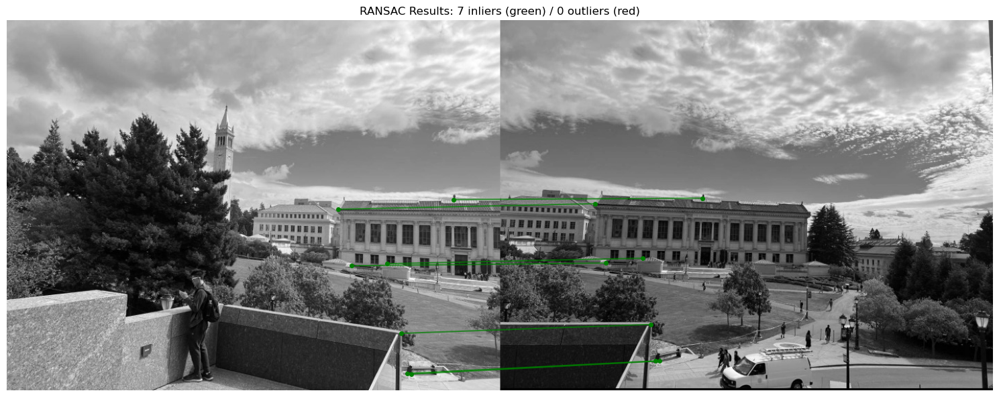

Creating mosaic with mutual warping...
Mutual warping mosaic canvas: 1035x701 pixels
Processing image 1/2 with mutual warping...
Processing image 2/2 with mutual warping...


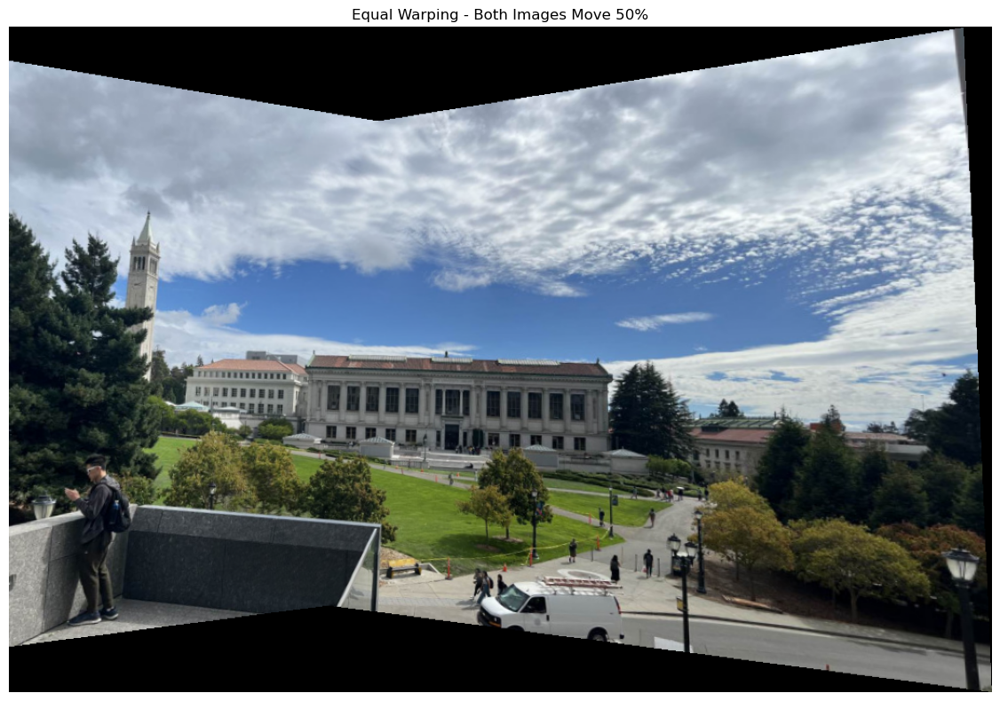

In [19]:
im1 = io.imread('DoeLibrary1.jpg')
im2 = io.imread('DoeLibrary2.jpg')
# Equal warping
print("=== Testing Equal Warping (50%/50%) ===")
mosaic1, H1, matches1, inliers1 = automatic_stitching_mutual_warping(
    im1, im2, warp_strength=0.5, ratio_threshold = 0.7, ransac_threshold = 5.0
)

if mosaic1 is not None:
    plt.figure(figsize=(12, 8))
    plt.imshow(mosaic1)
    plt.title('Equal Warping - Both Images Move 50%')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    plt.imsave("mosaic1_output.png", mosaic1)
else:
    print("Equal warping failed")



=== Testing Image2-Heavy Warping (20%/80%) ===
=== Automatic Stitching with Mutual Warping ===
Initial matches: 17
Running RANSAC with 17 matches, 1000 iterations...
RANSAC found 15 inliers out of 17 matches

=== HOMOGRAPHY MATRIX COMPARISON ===
Original 4-point homography:
[[ 1.73894235e+00 -1.19343060e-02 -4.51686428e+02]
 [ 5.65287004e-01  1.43694138e+00 -1.77786695e+02]
 [ 1.86218250e-03 -4.96354723e-04  1.00000000e+00]]

Final refined homography (using all inliers):
[[ 1.63737927e+00  2.64454787e-02 -4.32785431e+02]
 [ 4.18171149e-01  1.45416455e+00 -1.44053287e+02]
 [ 1.39261576e-03 -8.94454654e-05  1.00000000e+00]]

Difference between matrices:
[[-1.01563078e-01  3.83797847e-02  1.89009976e+01]
 [-1.47115856e-01  1.72231730e-02  3.37334078e+01]
 [-4.69566736e-04  4.06909257e-04  0.00000000e+00]]


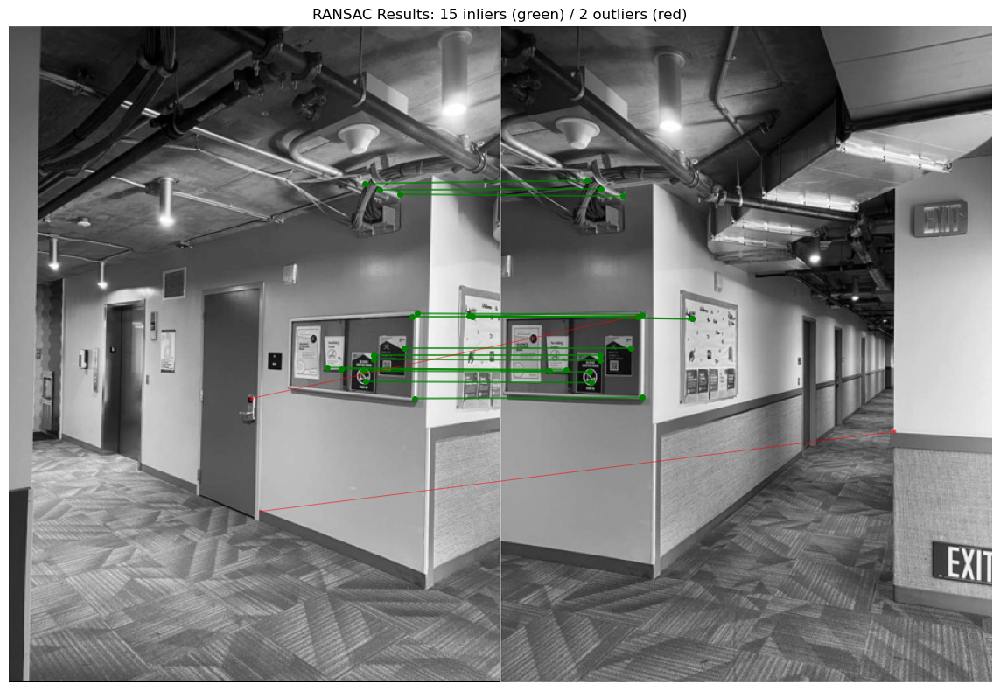

Creating mosaic with mutual warping...
Mutual warping mosaic canvas: 783x815 pixels
Processing image 1/2 with mutual warping...
Processing image 2/2 with mutual warping...


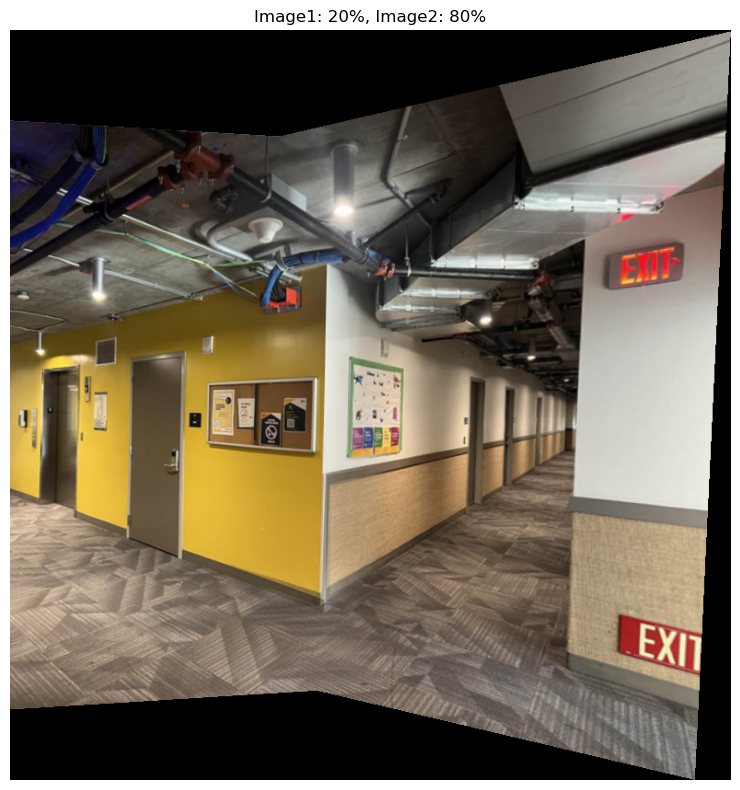

In [20]:
im3 = io.imread('test1.jpg')
im4 = io.imread('test2.jpg')

print("\n=== Testing Image2-Heavy Warping (20%/80%) ===")
mosaic2, H2, matches2, inliers2 = automatic_stitching_mutual_warping(
    im3, im4, warp_strength=0.2, ratio_threshold=0.8, ransac_threshold=4.0
)

if mosaic2 is not None:
    plt.figure(figsize=(12, 8))
    plt.imshow(mosaic2)
    plt.title('Image1: 20%, Image2: 80%')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    # Save the stitched mosaic
    plt.imsave("mosaic2_output.png", mosaic2)

else:
    print("Image2-heavy warping failed")


=== Testing Image2-Heavy Warping (20%/80%) ===
=== Automatic Stitching with Mutual Warping ===
Initial matches: 54
Running RANSAC with 54 matches, 1000 iterations...
RANSAC found 52 inliers out of 54 matches

=== HOMOGRAPHY MATRIX COMPARISON ===
Original 4-point homography:
[[ 1.68331596e+00 -1.37585869e-01 -4.33304128e+02]
 [ 3.37452095e-01  1.35583731e+00 -1.23146374e+02]
 [ 9.32072971e-04 -2.57513210e-04  1.00000000e+00]]

Final refined homography (using all inliers):
[[ 1.75508418e+00 -9.65883998e-02 -4.70028493e+02]
 [ 3.49104763e-01  1.42593649e+00 -1.32402829e+02]
 [ 9.78018618e-04 -1.71053018e-04  1.00000000e+00]]

Difference between matrices:
[[ 7.17682245e-02  4.09974695e-02 -3.67243650e+01]
 [ 1.16526677e-02  7.00991800e-02 -9.25645436e+00]
 [ 4.59456470e-05  8.64601918e-05  0.00000000e+00]]


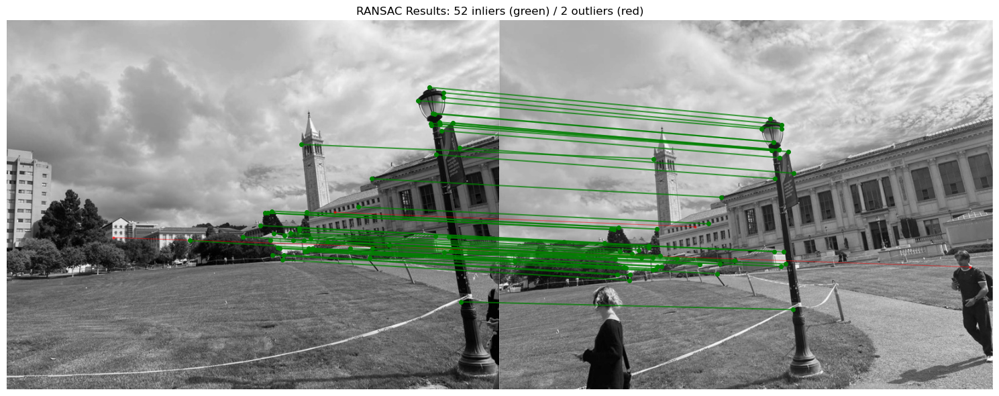

Creating mosaic with mutual warping...
Mutual warping mosaic canvas: 1210x840 pixels
Processing image 1/2 with mutual warping...
Processing image 2/2 with mutual warping...


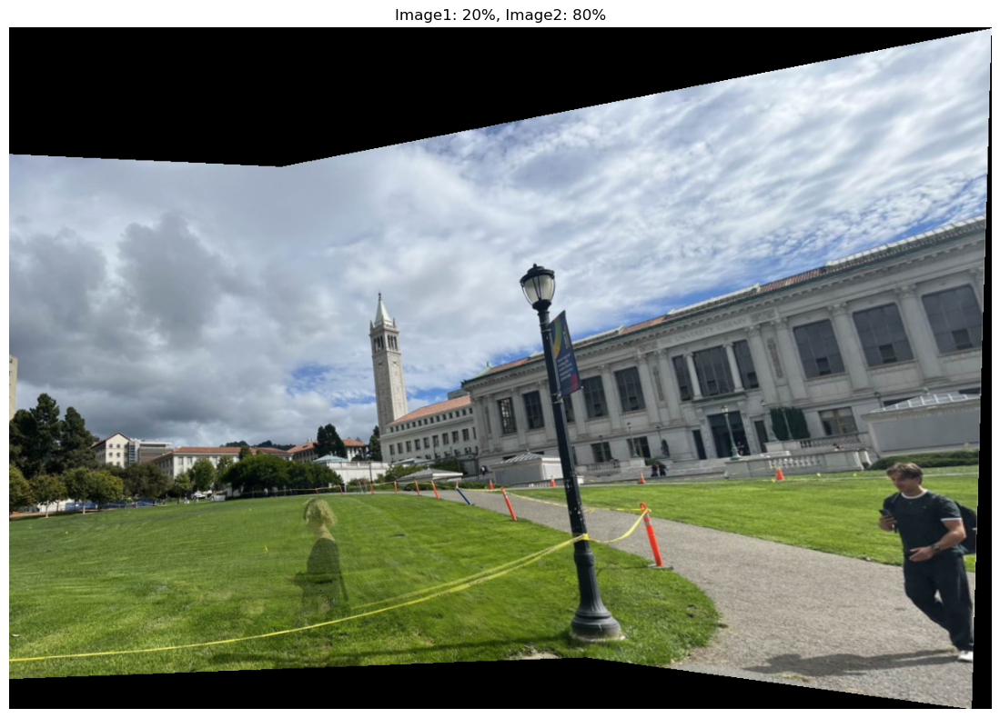

In [21]:
im5 = io.imread('test3.jpg')
im6 = io.imread('test4.jpg')

print("\n=== Testing Image2-Heavy Warping (20%/80%) ===")
mosaic3, H3, matches3, inliers3 = automatic_stitching_mutual_warping(
    im5, im6, warp_strength=0.2, ratio_threshold=0.8, ransac_threshold=3.0
)

if mosaic3 is not None:
    plt.figure(figsize=(12, 8))
    plt.imshow(mosaic3)
    plt.title('Image1: 20%, Image2: 80%')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    # Save the stitched mosaic
    plt.imsave("mosaic3_output.png", mosaic3)

else:
    print("Image2-heavy warping failed")

=== Testing Equal Warping (50%/50%) ===
=== Automatic Stitching with Mutual Warping ===
Initial matches: 4
Running RANSAC with 4 matches, 1000 iterations...
RANSAC found 4 inliers out of 4 matches

=== HOMOGRAPHY MATRIX COMPARISON ===
Original 4-point homography:
[[-1.18998089e-02 -1.11083120e+00  3.24228212e+02]
 [-4.47345464e-02 -8.82717313e-01  2.66989894e+02]
 [-1.54662263e-04 -3.31803575e-03  1.00000000e+00]]

Final refined homography (using all inliers):
[[-1.18998089e-02 -1.11083120e+00  3.24228212e+02]
 [-4.47345464e-02 -8.82717313e-01  2.66989894e+02]
 [-1.54662263e-04 -3.31803575e-03  1.00000000e+00]]


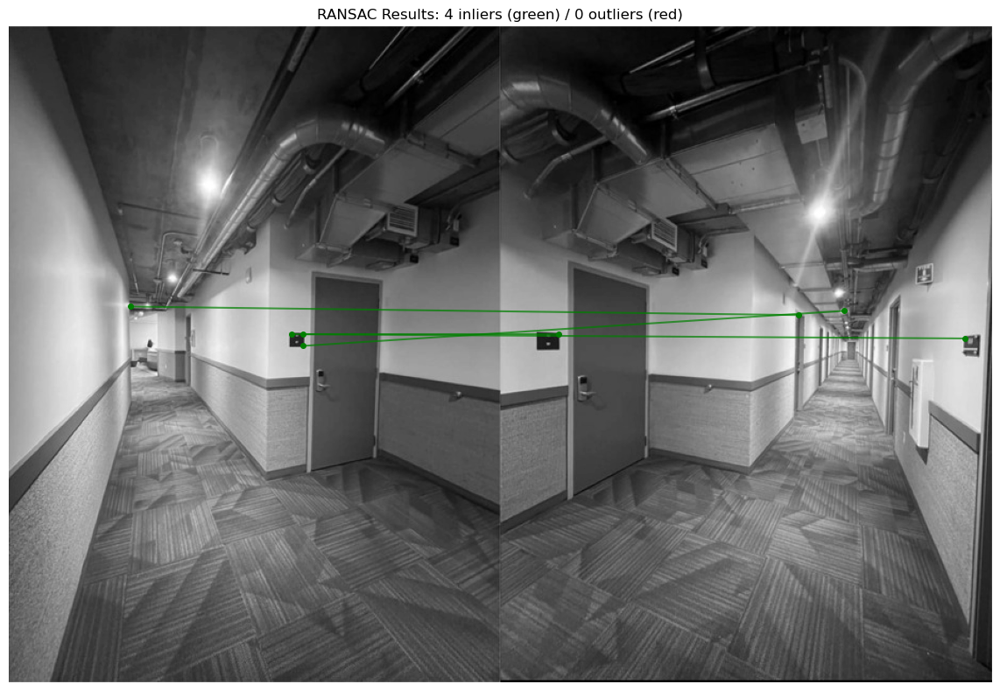

Creating mosaic with mutual warping...
Mutual warping mosaic canvas: 461x616 pixels
Processing image 1/2 with mutual warping...
Processing image 2/2 with mutual warping...


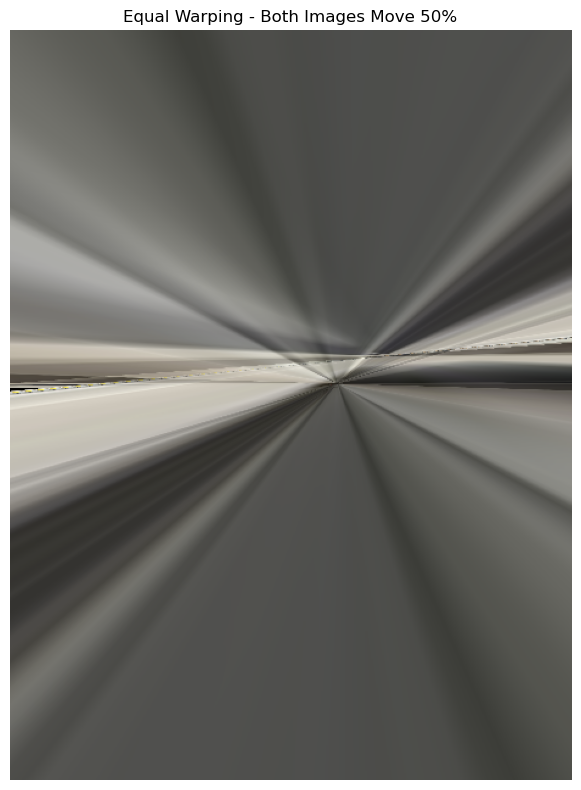

In [22]:
im7 = io.imread('test5.jpg')
im8 = io.imread('test6.jpg')
# Equal warping
print("=== Testing Equal Warping (50%/50%) ===")
mosaic4, H4, matches4, inliers4 = automatic_stitching_mutual_warping(
    im7, im8, warp_strength=0.5, ratio_threshold=0.9, ransac_threshold=2.0
)

if mosaic4 is not None:
    plt.figure(figsize=(12, 8))
    plt.imshow(mosaic4)
    plt.title('Equal Warping - Both Images Move 50%')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    plt.imsave("mosaic4_output.png", mosaic4)
else:
    print("Equal warping failed")